## Part A: Motivation

### Why did you choose the Pitt Athletics final project?
#### What interested me
#### Was in the application in particular
#### Was it the aspects of the data e.g. regression/classification, data size, etc..
### How interested are you in this project?
#### Could you not decide between two?

Initially I was very interested in this project, I find the data types interesting specifically the fact that there are clearly data in this data set that was gathered voluntarily vs data that is required to purchase tickets. I am interested in what it means to explore data when some of that data is missing, and to look for patterns in data the may not be what you would expect. The data in the Pitt athletics project feels very accessible to me in that I understand all of the values and categories and I understand how the data is being recorded. The accessibility is important to me because it helps me feel more comfortable in understanding what I am doing when I am visualizing the data and to have some idea of what relationships might be interesting. The other projects I feel less confident in my understanding of the data included in the data sets, or how to work with it. The size of this data set also seemed manageable. I think as a first experience with this sort of data visualization project I wanted to pick something that I felt comfortable with and where the size of the data wasn't so large that it felt unmanageable.

This is really the only project I am interested in, it felt easy to choose this instead of the other projects.

### After Parts B, C, and D:

#### After exploring the data and working through how you would model the data in more detail, would you prefer to work on a different project?
#### Do you find this application not interesting? Is it confusing? Is the application just not something you want to work on?

After exploring the data I would say that even with data I feel more comfortable with it is still complicated. I think this application is interesting but also confusing. I think this data set is still one that I want to work with but it certainly isn't as straightforward as I thought it would be to work with. I certainly want to stick with this data, it is just different from what I expected. I am however appreciating that the number of categorical variables and that it has a categorical output is something I am likely to run in to in many other areas that interest me so I am interested in understanding this data better going forward.

## Part B: Predictive modeling discussion

### Classification problem
The data set from Pitt athletics has the aim of finding paterns as to which pitt football season ticket holders are likely to return the next season and which are less likely to return next season. This means that the outcome variable for this data set is `return_next_season` which is a categorical variable as such this data set presents a classification problem. Because returning for the following season as a season ticket holder is the outcome that we are looking at, that is our only outcome variable. All other variables in the data set are then potentially input variables. In this data set however there are also two identifier variables, this set contains a randomly assigned account id number to identify all data associated with one account, there is also the season variable which this data only deals with one season as such it only has one value which is associated with every piece of data in the data set.

### Input Variables
The input variables are:
* gender
* direction
* purchase_month
* purchase_dow
* price_type
* price_level
* age
* distancemiles
* peak_drivetime
* offpeak_drivetime
* ticket_count
* price_per_ticket

### Outcome Variable
* return_next_season

#### I Did not need to derive responses of interest by summarizing the available data

### Identifier Variables
* accountid
* season

### After Completing Parts C and D:

### Which inputs influence the response based on your exploratory visualizations?

It appears that `purchase_month`, `distance`, `direction`, `drivetime`, `price_level`, `purchase_month`, and `price_type` have some influence on the response variable.

#### Which exploratory visualization helped you identify potential input-to-output relationships?

The pairs plot, point plot, and correlation heatmap visualization helped to see if any of the continuous variables or pairs of continuous variables had an input-to-output relationship. For categorical variables a dodged bar chart was the most helpful to explore potential input-to-output relationships, however in cases where there were such low counts that it is hard to compare using a heatmap helped to see incredibly small counts.


## Part C: Exploratory Data Analysis 

### Essential exploration

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

In [2]:
pitt_athl_data = pd.read_csv('pitt_athletics_cmpinf2100_project.csv')

In [3]:
pitt_athl_data.shape

(3360, 15)

In [4]:
pitt_athl_data.columns

Index(['accountid', 'age', 'gender', 'distancemiles', 'direction',
       'peak_drivetime', 'offpeak_drivetime', 'season', 'purchase_month',
       'purchase_dow', 'price_type', 'price_level', 'ticket_count',
       'price_per_ticket', 'return_next_season'],
      dtype='object')

In [5]:
pitt_athl_data.dtypes

accountid               int64
age                   float64
gender                 object
distancemiles         float64
direction              object
peak_drivetime        float64
offpeak_drivetime     float64
season                  int64
purchase_month         object
purchase_dow           object
price_type             object
price_level            object
ticket_count            int64
price_per_ticket      float64
return_next_season     object
dtype: object

In [6]:
pitt_athl_data.isna().sum()

accountid                0
age                   1793
gender                2778
distancemiles            0
direction                0
peak_drivetime         402
offpeak_drivetime      364
season                   0
purchase_month           0
purchase_dow             0
price_type               0
price_level              0
ticket_count             0
price_per_ticket         0
return_next_season       0
dtype: int64

In [7]:
pitt_athl_data.nunique()

accountid             3360
age                     70
gender                   4
distancemiles         3300
direction                8
peak_drivetime        2311
offpeak_drivetime     2333
season                   1
purchase_month           3
purchase_dow             6
price_type               4
price_level              8
ticket_count            20
price_per_ticket       113
return_next_season       2
dtype: int64

### State if I am going to use ticket_count as categorical or numeric
When looking at the visualizations I took time to examine `ticket_count` as both a catergorical and a continuous variable. However after looking at the outputs it appears to me that `ticket_count` is better considered a categorical than a numeric variable. I think when working with a numeric column that has 20 values it is important to visualize it both as a categorical and numeric at first and use that to make the decision of if you are going to continue treating it as a categorical or a numeric.

### Marginal distributions

### Categorical Variables

In [8]:
pitt_athl_data_objects = pitt_athl_data.select_dtypes('object').copy()

In [9]:
pitt_athl_data_objects_column = pitt_athl_data_objects.columns.to_list().copy()

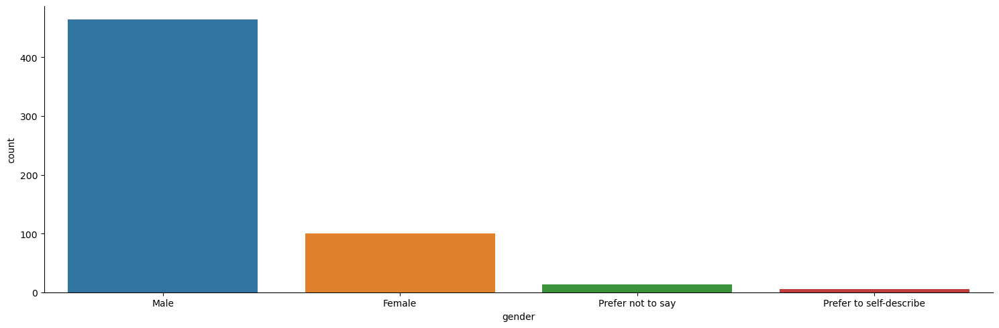

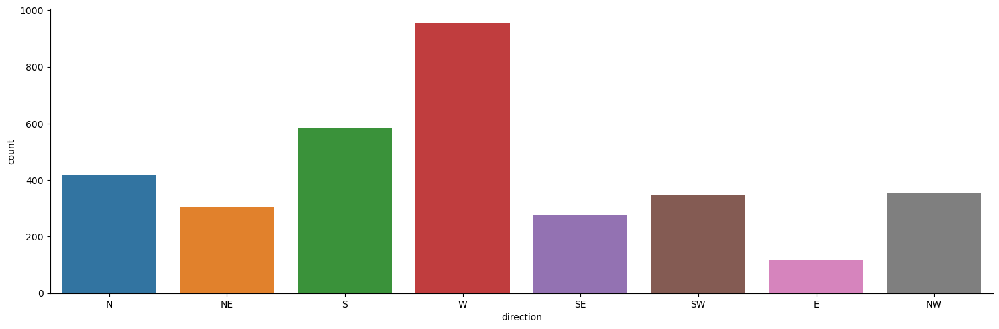

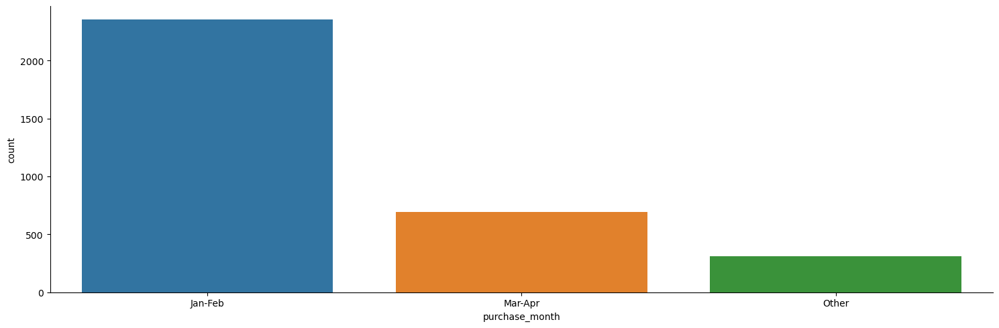

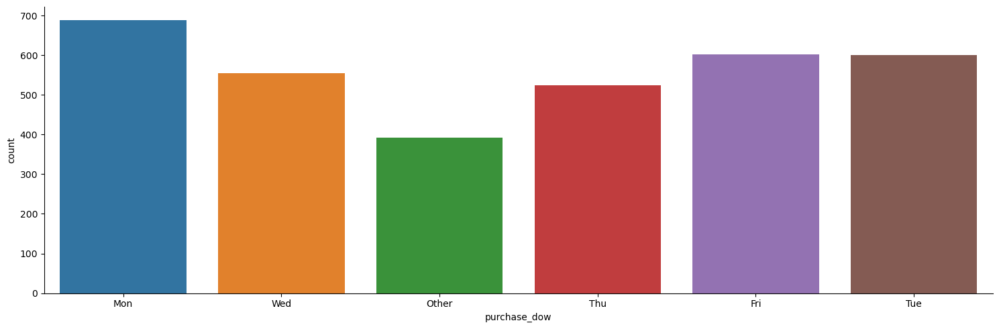

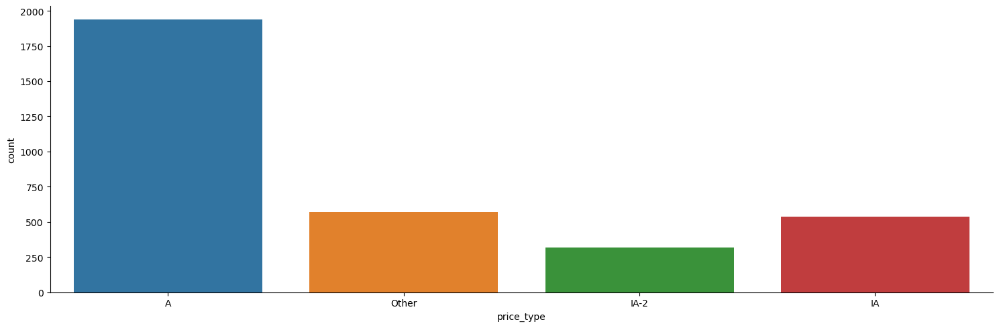

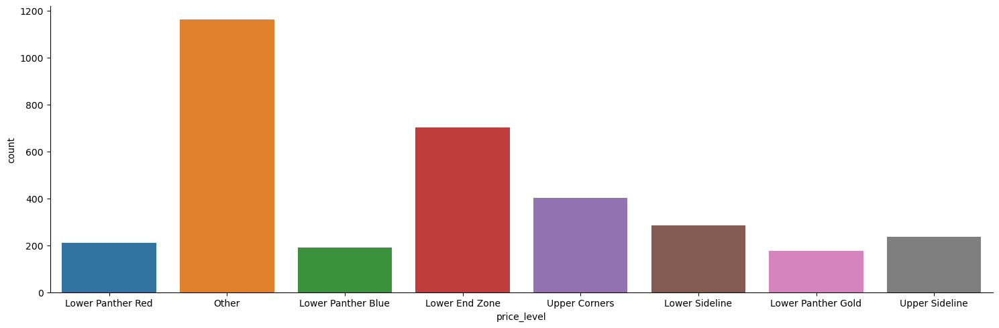

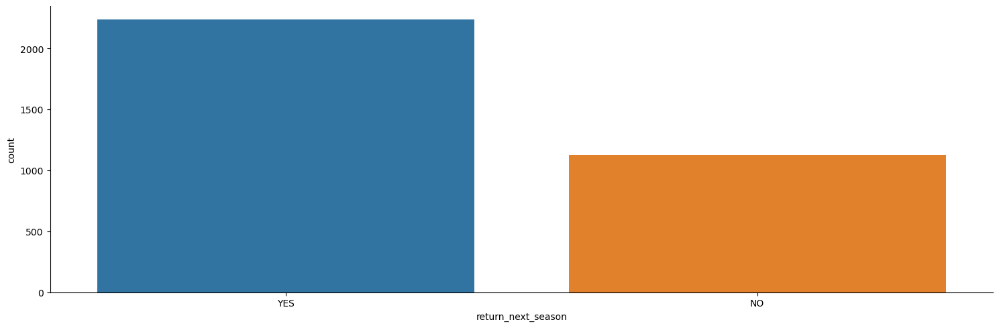

In [10]:
for column in pitt_athl_data_objects_column:
    sns.catplot(data =pitt_athl_data_objects, x=column, kind='count', aspect=3)
    
plt.show()

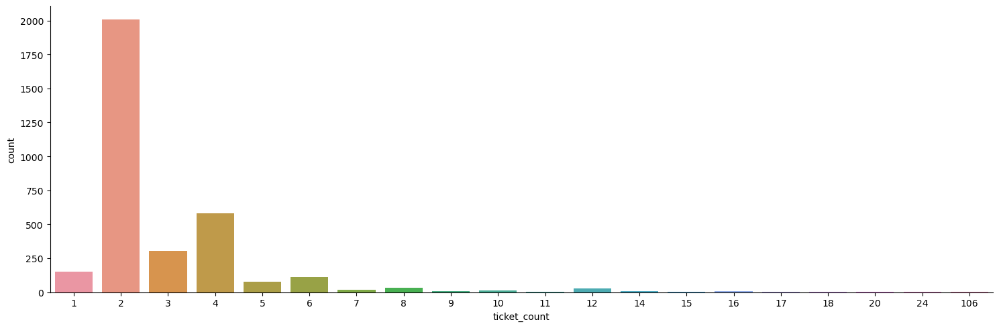

In [11]:
sns.catplot( data = pitt_athl_data, x='ticket_count', kind='count', aspect=3 )

plt.show()

### Continuous Variables

In [12]:
pitt_athl_data_features= pitt_athl_data.select_dtypes('number').copy()

In [13]:
id_cols = ['rowid'] + pitt_athl_data_objects.columns.to_list()

In [14]:
pitt_athl_data_lf = pitt_athl_data.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols,value_vars=pitt_athl_data_features.columns)

In [15]:
pitt_athl_data_lf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26880 entries, 0 to 26879
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   rowid               26880 non-null  int64  
 1   gender              4656 non-null   object 
 2   direction           26880 non-null  object 
 3   purchase_month      26880 non-null  object 
 4   purchase_dow        26880 non-null  object 
 5   price_type          26880 non-null  object 
 6   price_level         26880 non-null  object 
 7   return_next_season  26880 non-null  object 
 8   variable            26880 non-null  object 
 9   value               24321 non-null  float64
dtypes: float64(1), int64(1), object(8)
memory usage: 2.1+ MB


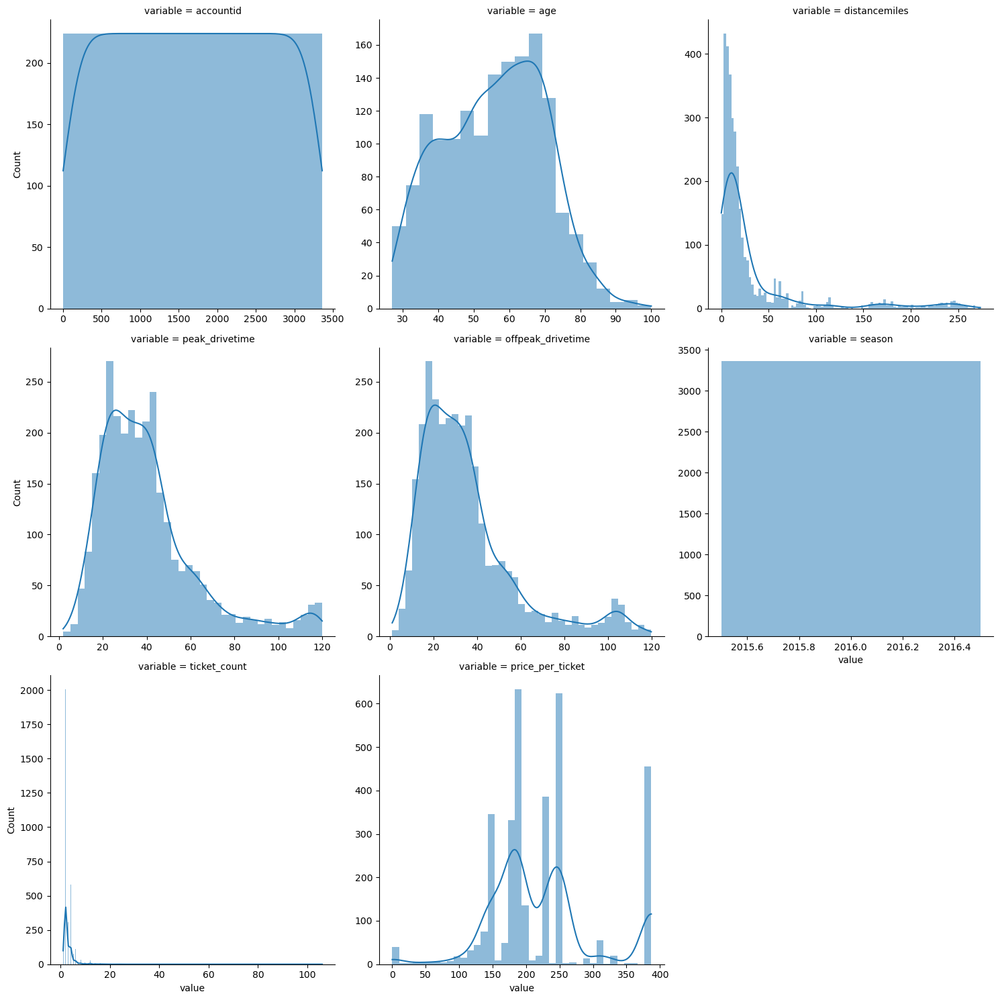

In [16]:
sns.displot(data=pitt_athl_data_lf, x='value', col='variable', kind='hist', col_wrap=3, kde=True,
           facet_kws={'sharex': False, 'sharey': False}, common_bins=False)
plt.show()

### Visualizations of relationships

### Conditional distributions of the continuous inputs GROUPED BY the (outcome) unique values.

C:\Users\msilv\AppData\Local\Temp\ipykernel_4868\3788772416.py:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(data=pitt_athl_data_lf, x='value', col='variable', kind='kde', hue='return_next_season', col_wrap=3,
C:\Users\msilv\AppData\Local\Temp\ipykernel_4868\3788772416.py:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(data=pitt_athl_data_lf, x='value', col='variable', kind='kde', hue='return_next_season', col_wrap=3,


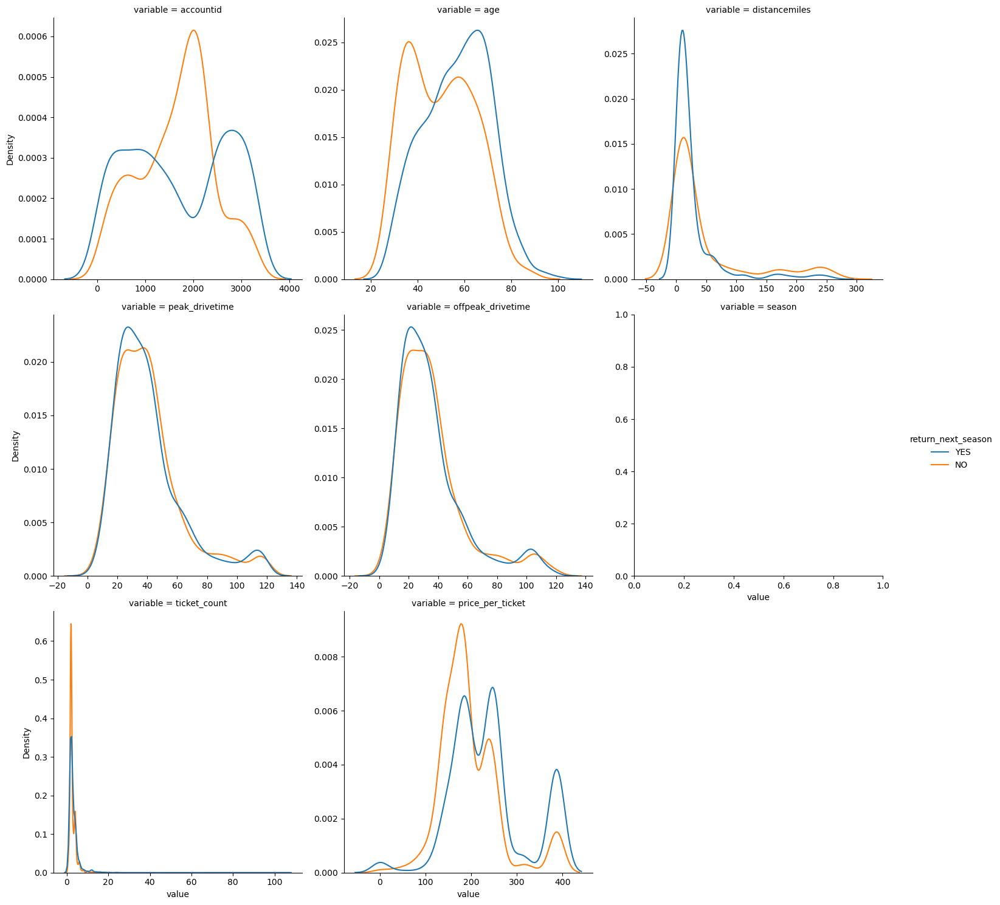

In [17]:
sns.displot(data=pitt_athl_data_lf, x='value', col='variable', kind='kde', hue='return_next_season', col_wrap=3,
           facet_kws={'sharex': False, 'sharey': False}, common_norm=False)
plt.show()

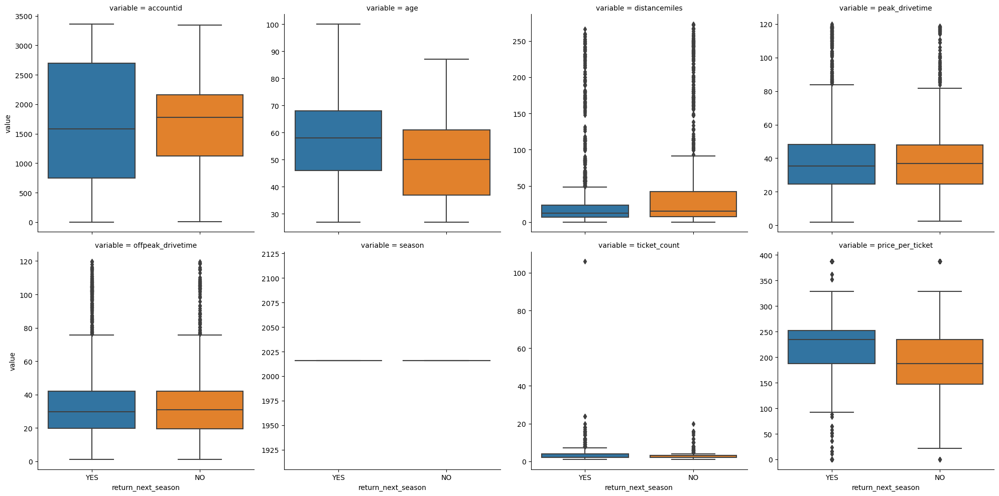

In [18]:
sns.catplot(data=pitt_athl_data_lf, x='return_next_season', y='value', col='variable', col_wrap=4,
            kind='box',
           sharey=False)

plt.show()

### Visualize relationships between continuous inputs GROUPED BY the response (outcome) unique values.

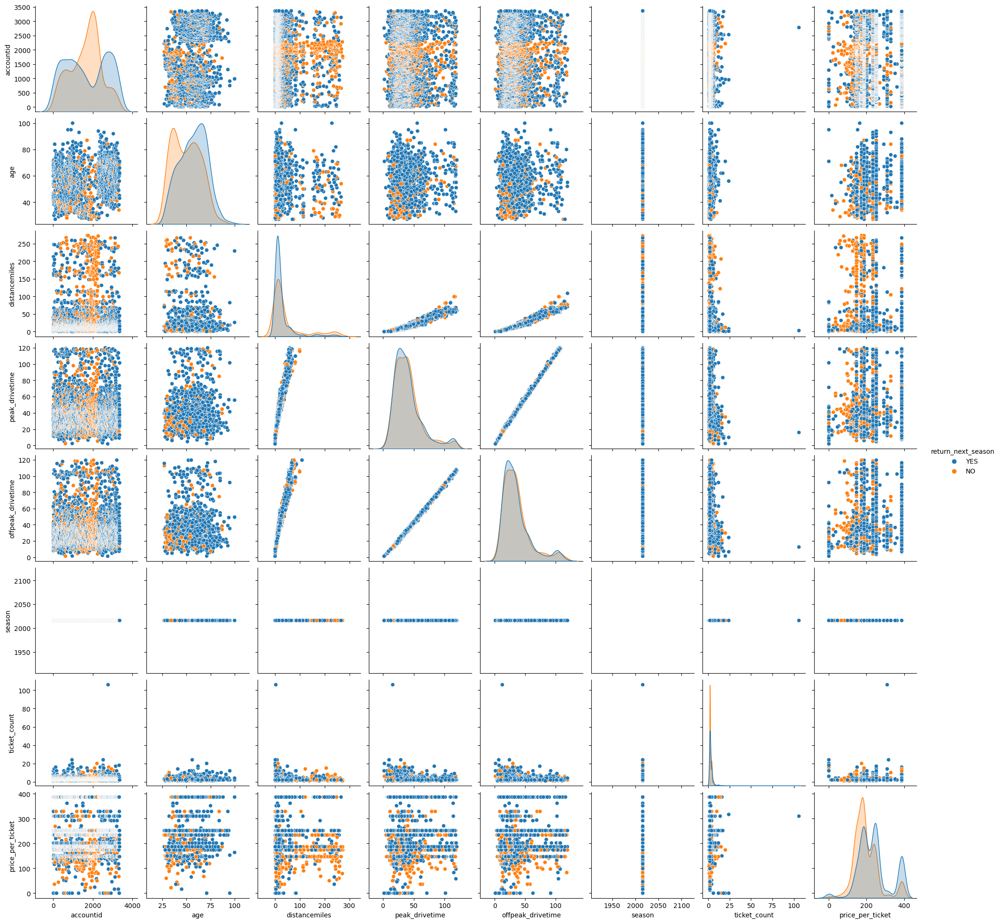

In [19]:
sns.pairplot(data = pitt_athl_data, hue='return_next_season', diag_kws={'common_norm': False})

plt.show()

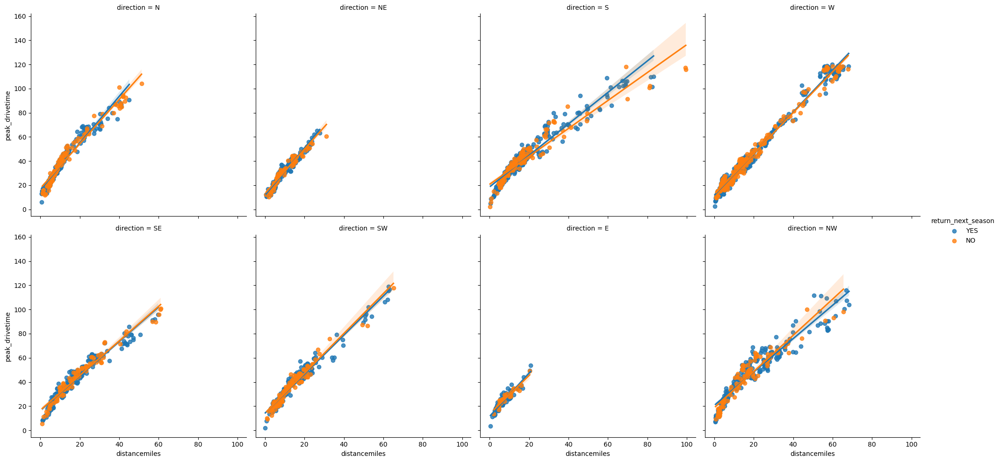

In [20]:
sns.lmplot(data = pitt_athl_data, x='distancemiles', y='peak_drivetime', col='direction', hue='return_next_season', col_wrap=4)

plt.show()

In [21]:
pitt_groups= pitt_athl_data.return_next_season.unique().tolist().copy()

In [22]:
corr_per_group = pitt_athl_data.loc[:, ['age', 'distancemiles', 'peak_drivetime', 'offpeak_drivetime', 'ticket_count', 'price_per_ticket', 'return_next_season']].groupby(['return_next_season']).corr()

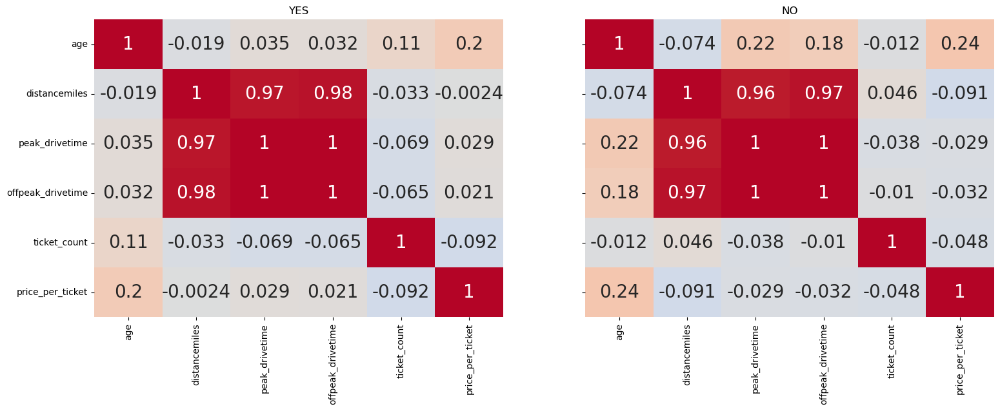

In [23]:
fig, axs = plt.subplots(1, len(pitt_groups), figsize=(18, 6), sharex=True, sharey=True )

for ix in range(len(pitt_groups)):
    sns.heatmap( data = corr_per_group.loc[ pitt_groups[ ix ] ],
                 vmin=-1, vmax=1, center = 0,
                 cmap='coolwarm', cbar=False,
                 annot=True, annot_kws={'size': 20},
                 ax=axs[ix] )
    
    axs[ ix ].set_title( pitt_groups[ ix ] )

plt.show()

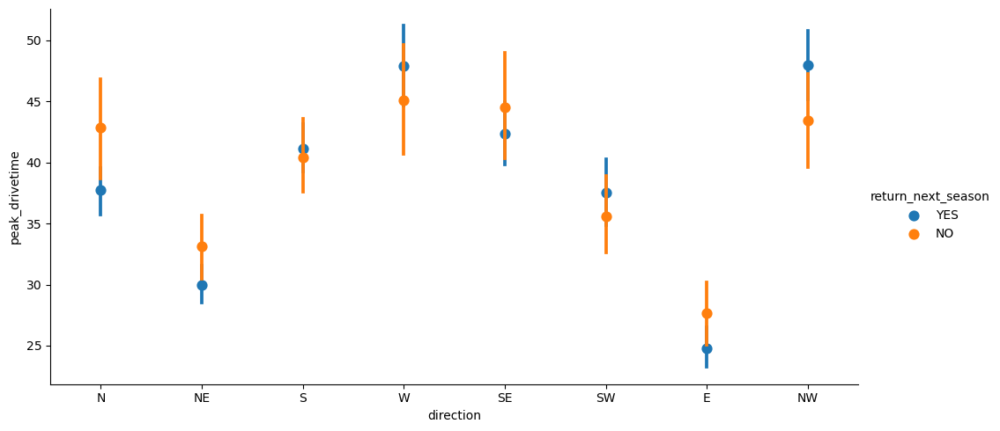

In [24]:
sns.catplot(data = pitt_athl_data, x='direction', y='peak_drivetime', hue='return_next_season', kind='point', aspect=2, join=False)

plt.show()

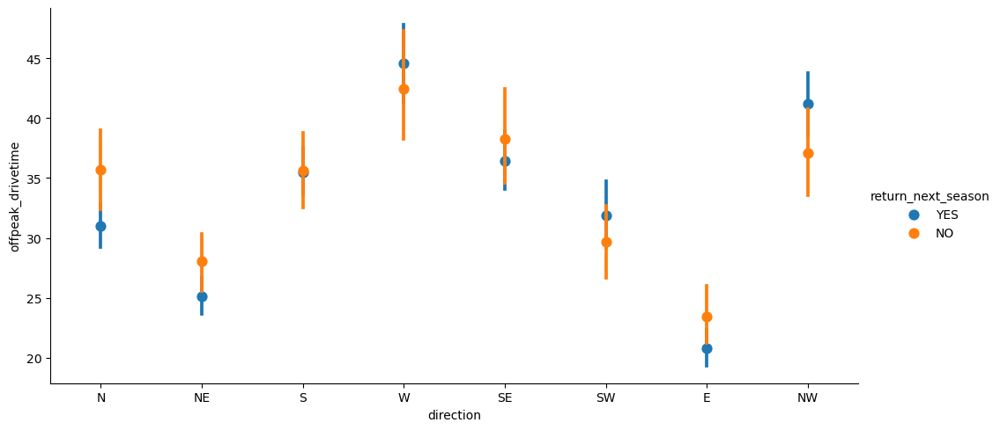

In [25]:
sns.catplot(data = pitt_athl_data, x='direction', y='offpeak_drivetime', hue='return_next_season', kind='point', aspect=2, join=False)

plt.show()

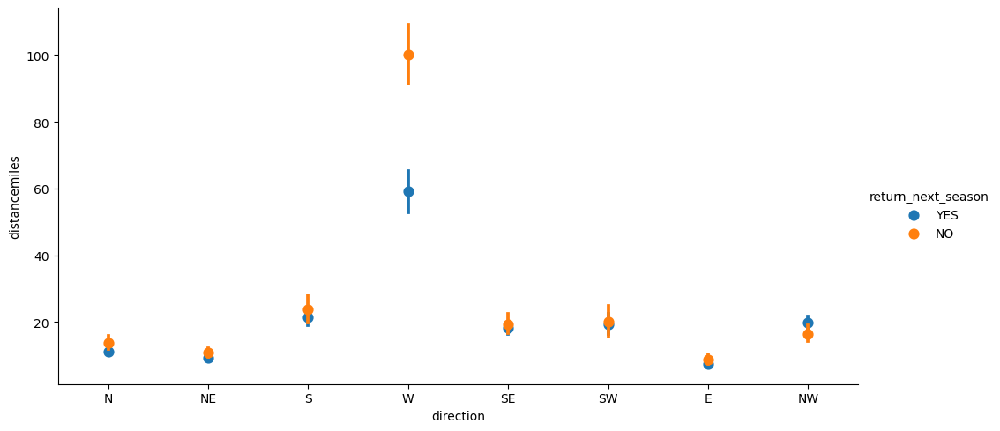

In [26]:
sns.catplot(data = pitt_athl_data, x='direction', y='distancemiles', hue='return_next_season', kind='point', aspect=2, join=False)

plt.show()

The visualization of `distancemiles` and `direction` grouped by `return_next_season` is helpful .

### Visualize the counts of combinations between the response (outcome) and categorical inputs.

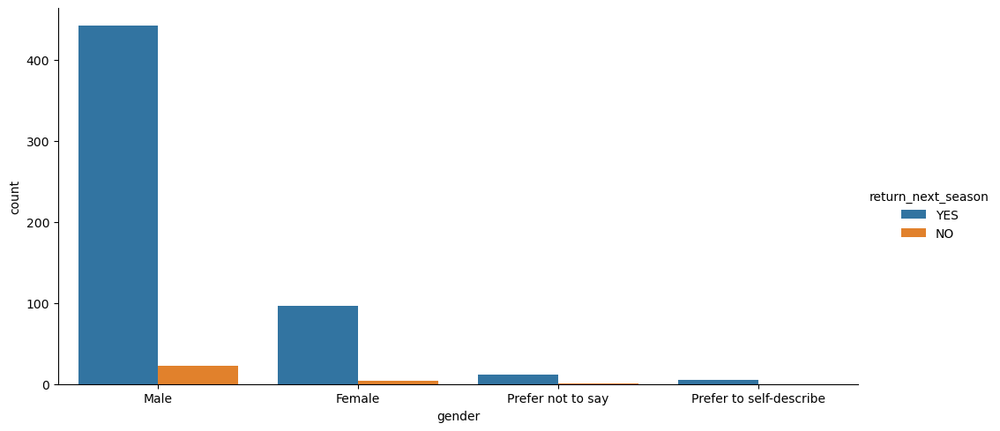

In [27]:
sns.catplot(data=pitt_athl_data, x='gender', hue='return_next_season', kind='count', aspect=2)

plt.show()

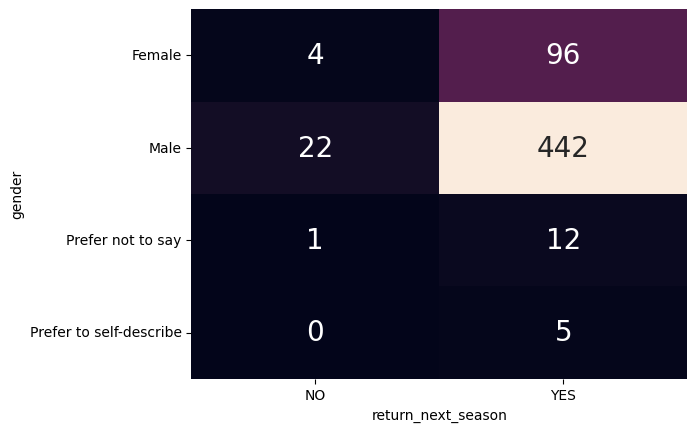

In [28]:
fig, ax = plt.subplots()

sns.heatmap( pd.crosstab( pitt_athl_data.gender, pitt_athl_data.return_next_season ), ax = ax,
             annot=True, annot_kws={'size': 20}, fmt='d',
             cbar=False)

plt.show()

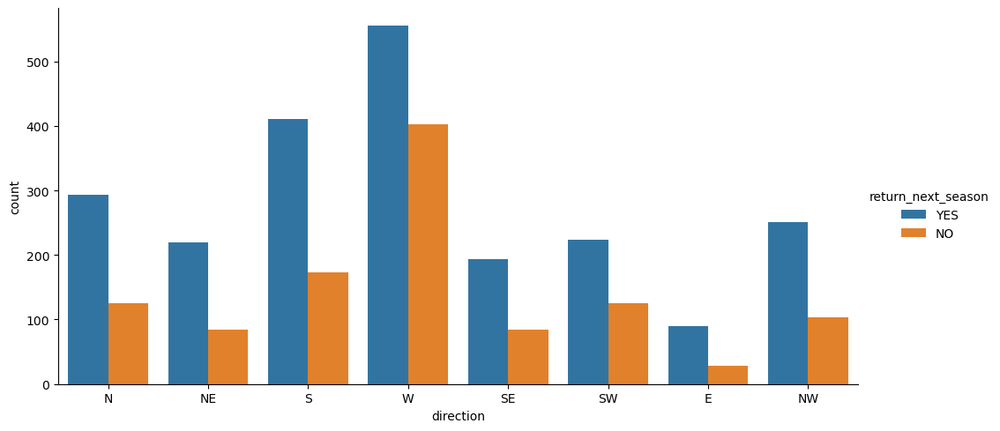

In [29]:
sns.catplot(data=pitt_athl_data, x='direction', hue='return_next_season', kind='count', aspect=2)

plt.show()

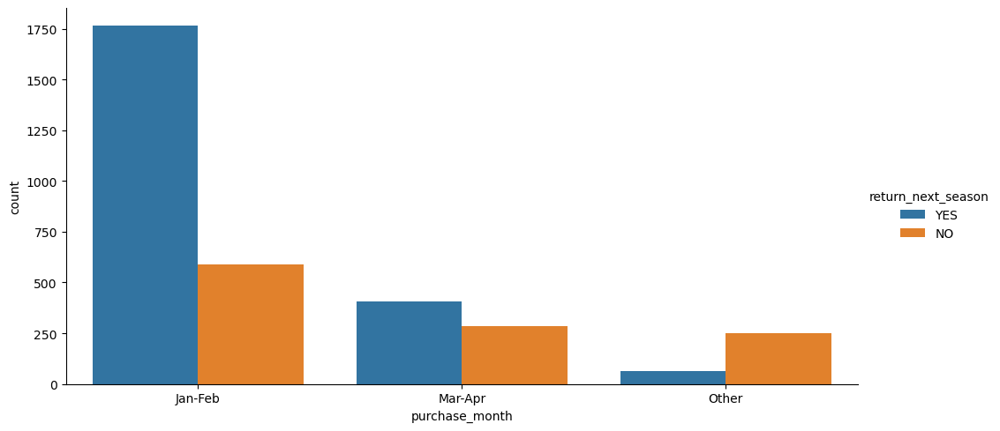

In [30]:
sns.catplot(data=pitt_athl_data, x='purchase_month', hue='return_next_season', kind='count', aspect=2)

plt.show()

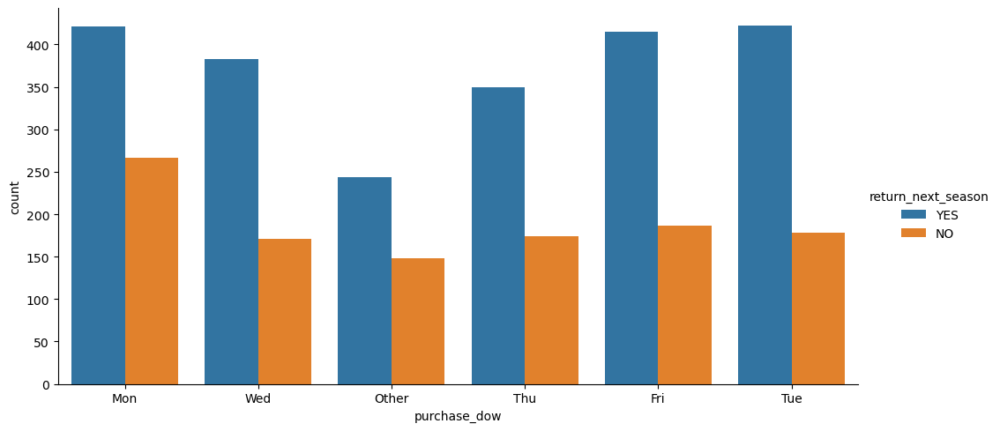

In [31]:
sns.catplot(data=pitt_athl_data, x='purchase_dow', hue='return_next_season', kind='count', aspect=2)

plt.show()

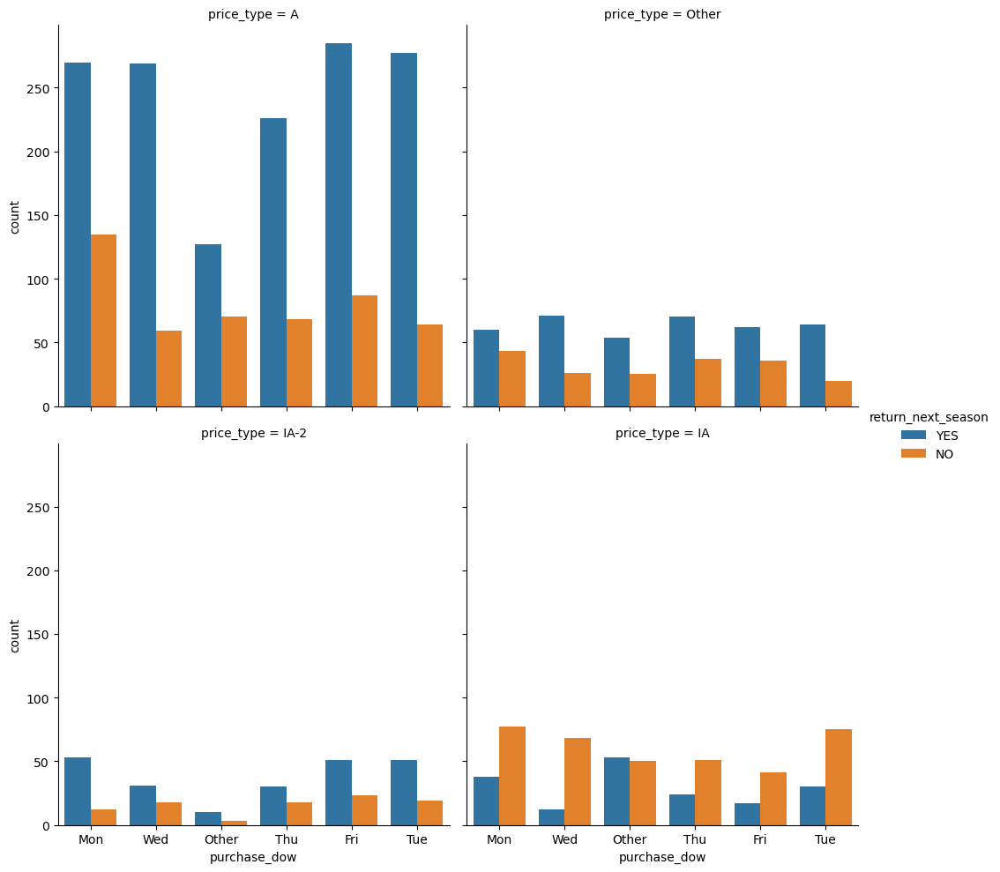

In [32]:
sns.catplot(data=pitt_athl_data, x='purchase_dow', col='price_type', hue='return_next_season', kind='count', col_wrap=2)

plt.show()

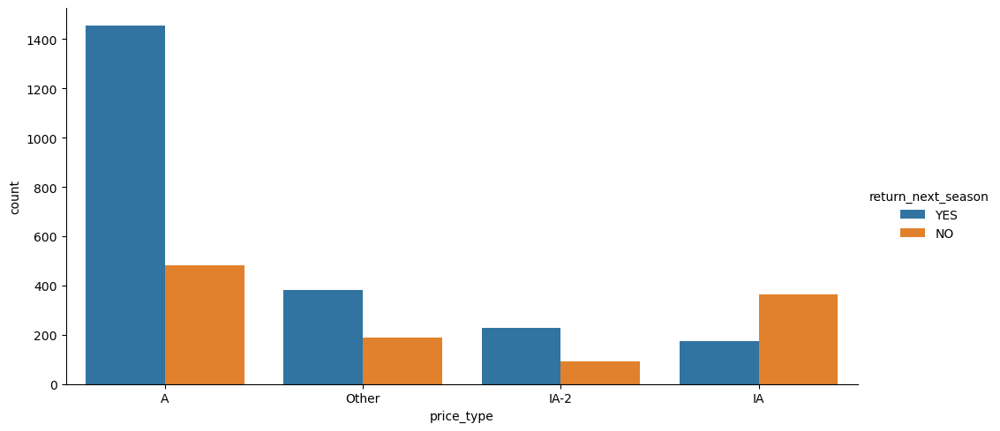

In [33]:
sns.catplot(data=pitt_athl_data, x='price_type', hue='return_next_season', kind='count', aspect=2)

plt.show()

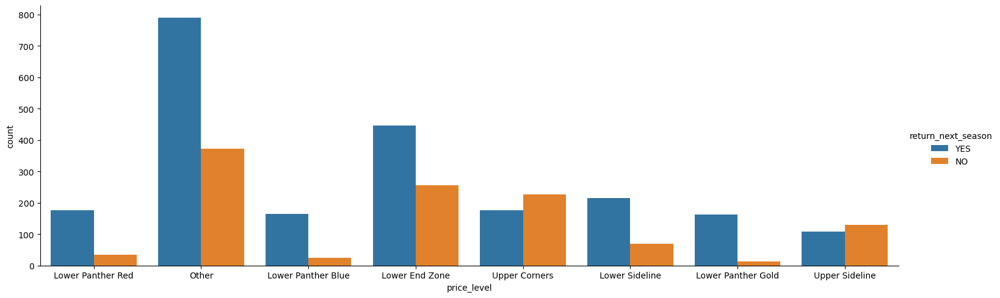

In [34]:
sns.catplot(data=pitt_athl_data, x='price_level', hue='return_next_season', kind='count', aspect=3)

plt.show()

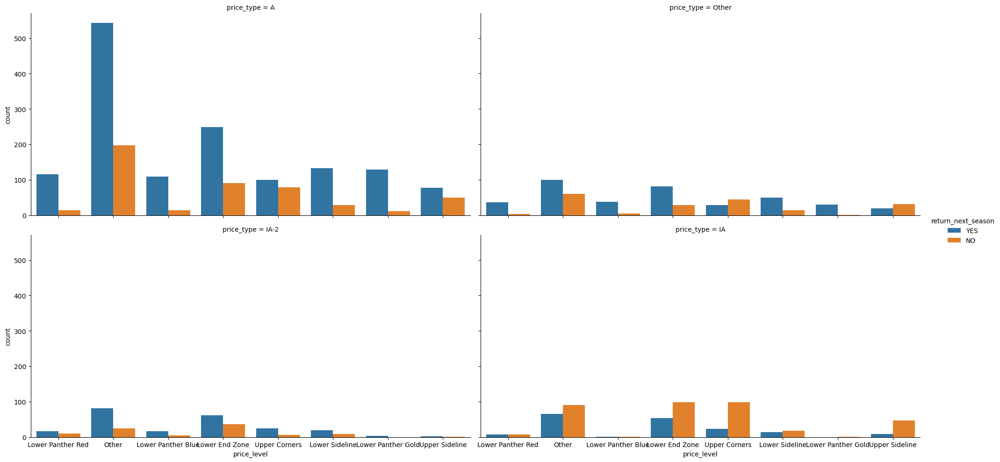

In [35]:
sns.catplot(data=pitt_athl_data, x='price_level', hue='return_next_season', col='price_type', kind='count', col_wrap=2, aspect=2)

plt.show()

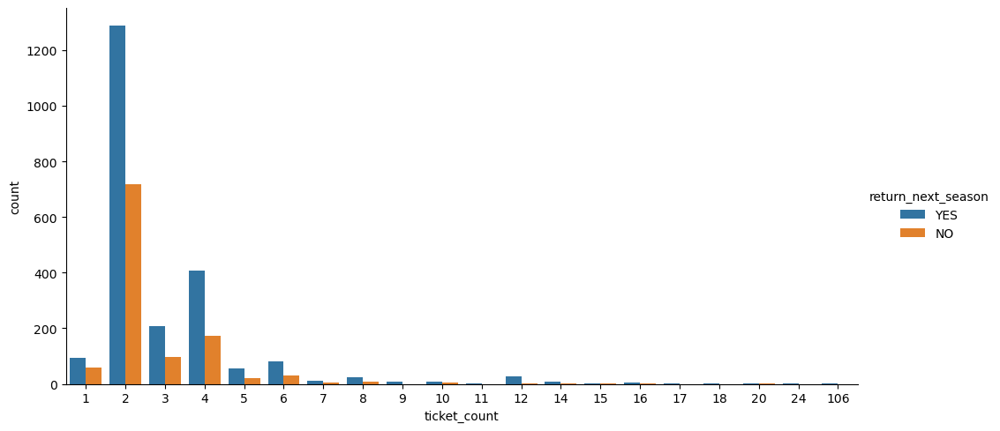

In [36]:
sns.catplot(data=pitt_athl_data, x='ticket_count', hue='return_next_season', kind='count', aspect=2)

plt.show()

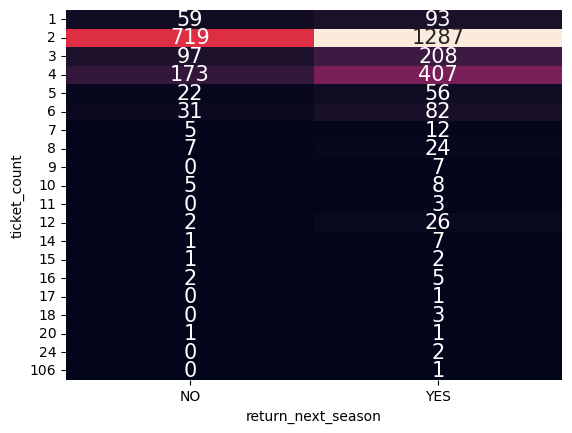

In [37]:
fig, ax = plt.subplots()

sns.heatmap( pd.crosstab( pitt_athl_data.ticket_count, pitt_athl_data.return_next_season ), ax = ax,
             annot=True, annot_kws={'size': 15}, fmt='d',
             cbar=False)

plt.show()

## Part D: Cluster analysis

### State which class of variables you used in your cluster analysis
I used continuous variables for my cluster analysis. I also used `StandardScaler` because `price_per_ticket` dominated the scale. It is important to note that there are many missing values in my data set, both `age` and `gender` are missing for many of the records in the data set as such when I cleaned my data the overall size of my data set changed drastically.

I chose to use the continuous variables because from the preliminary exploration there does not appear to be much correlation between the continuous input variables and the output variable. I wanted to use KMeans to see if there are patterns in the continuous variable relationships that I missed in my preliminary exploration.



## 2 Clusters:

* Count the number of observations per identified cluster. Are the clusters balanced?
* Visualize the cluster results between 2 of the variables used for the cluster analysis.
* Visualize the cluster results using PCA. Is the visualization easier to interpret than the previous one?

In [38]:
pitt_data_clean = pitt_athl_data.dropna().copy()

In [39]:
pitt_data_clean_copy = pitt_data_clean.drop(['accountid', 'season'], axis=1).copy()

In [40]:
pitt_data_clean_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 512 entries, 2 to 3339
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   age                 512 non-null    float64
 1   gender              512 non-null    object 
 2   distancemiles       512 non-null    float64
 3   direction           512 non-null    object 
 4   peak_drivetime      512 non-null    float64
 5   offpeak_drivetime   512 non-null    float64
 6   purchase_month      512 non-null    object 
 7   purchase_dow        512 non-null    object 
 8   price_type          512 non-null    object 
 9   price_level         512 non-null    object 
 10  ticket_count        512 non-null    int64  
 11  price_per_ticket    512 non-null    float64
 12  return_next_season  512 non-null    object 
dtypes: float64(5), int64(1), object(7)
memory usage: 56.0+ KB


In [41]:
X = pitt_data_clean.select_dtypes('number').copy().to_numpy()

In [42]:
X_copy = pitt_data_clean_copy.select_dtypes('number').copy().to_numpy()

In [43]:
clean_features = pitt_data_clean_copy.select_dtypes('number').copy()

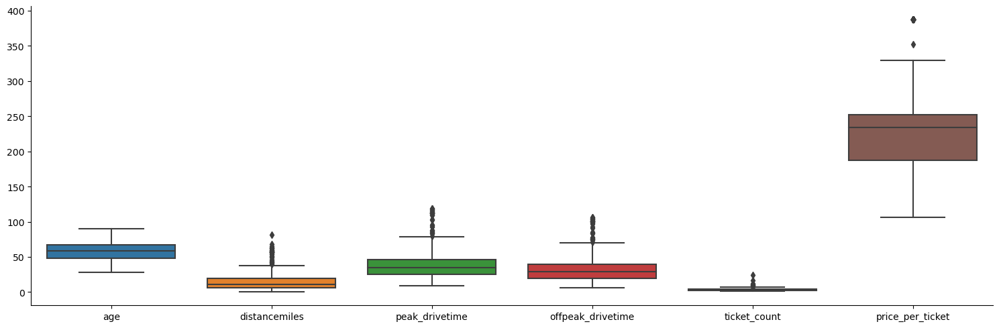

In [44]:
sns.catplot(data=pd.DataFrame(X_copy, columns=clean_features.columns), kind='box', aspect=3)

plt.show()

In [45]:
from sklearn.preprocessing import StandardScaler

In [46]:
Xpitt_copy = StandardScaler().fit_transform(clean_features).copy()

In [47]:
Xpitt_copy.shape

(512, 6)

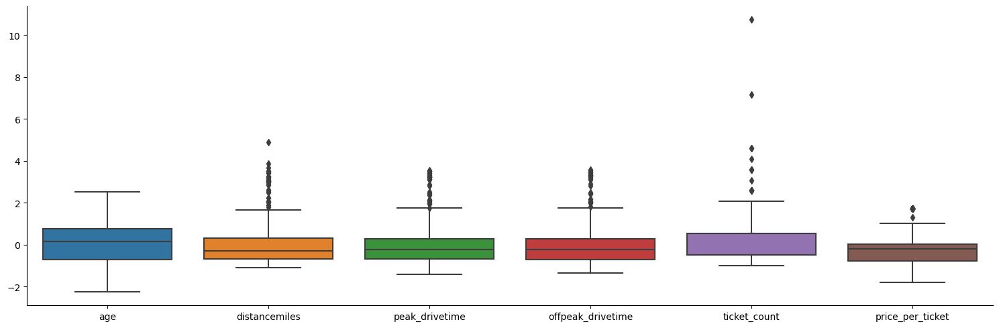

In [48]:
sns.catplot(data=pd.DataFrame(Xpitt_copy, columns=clean_features.columns), kind='box', aspect=3)

plt.show()

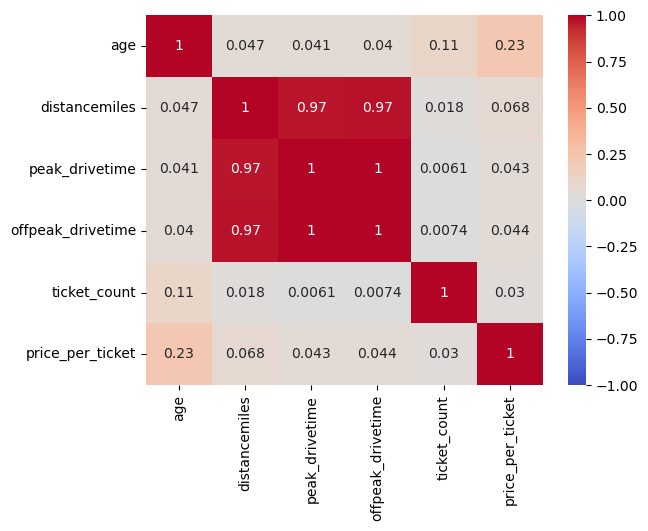

In [49]:
fig, ax = plt.subplots()

sns.heatmap(data = pitt_data_clean_copy.corr(numeric_only=True),
            vmin=-1, vmax=1, center=0,
            cmap='coolwarm', annot=True, 
            ax=ax)

plt.show()

In [50]:
from sklearn.cluster import KMeans

In [51]:
clusters_2 = KMeans(n_clusters=2, random_state=121, n_init=25, max_iter=500).fit_predict(Xpitt_copy)

C:\Users\msilv\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [52]:
pitt_data_clean_copy['k2']=pd.Series( clusters_2, index=pitt_data_clean_copy.index).astype('category')

In [53]:
pitt_data_clean_copy.k2.value_counts(dropna=False)

1    434
0     78
Name: k2, dtype: int64

The 2 clusters are very much not balenced, one contains 434 points while the other contains only 78.

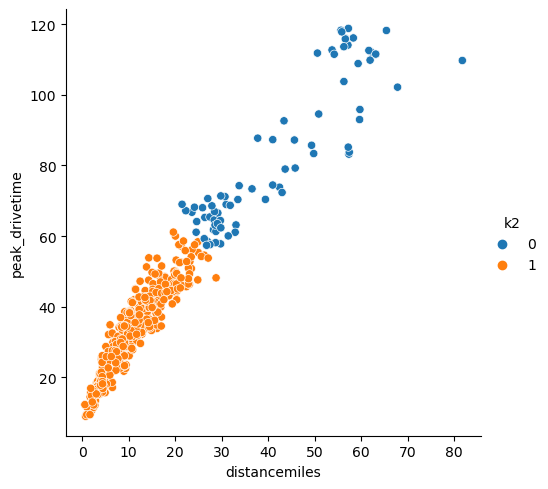

In [54]:
sns.relplot(data = pitt_data_clean_copy, x='distancemiles', y='peak_drivetime', hue='k2')

plt.show()

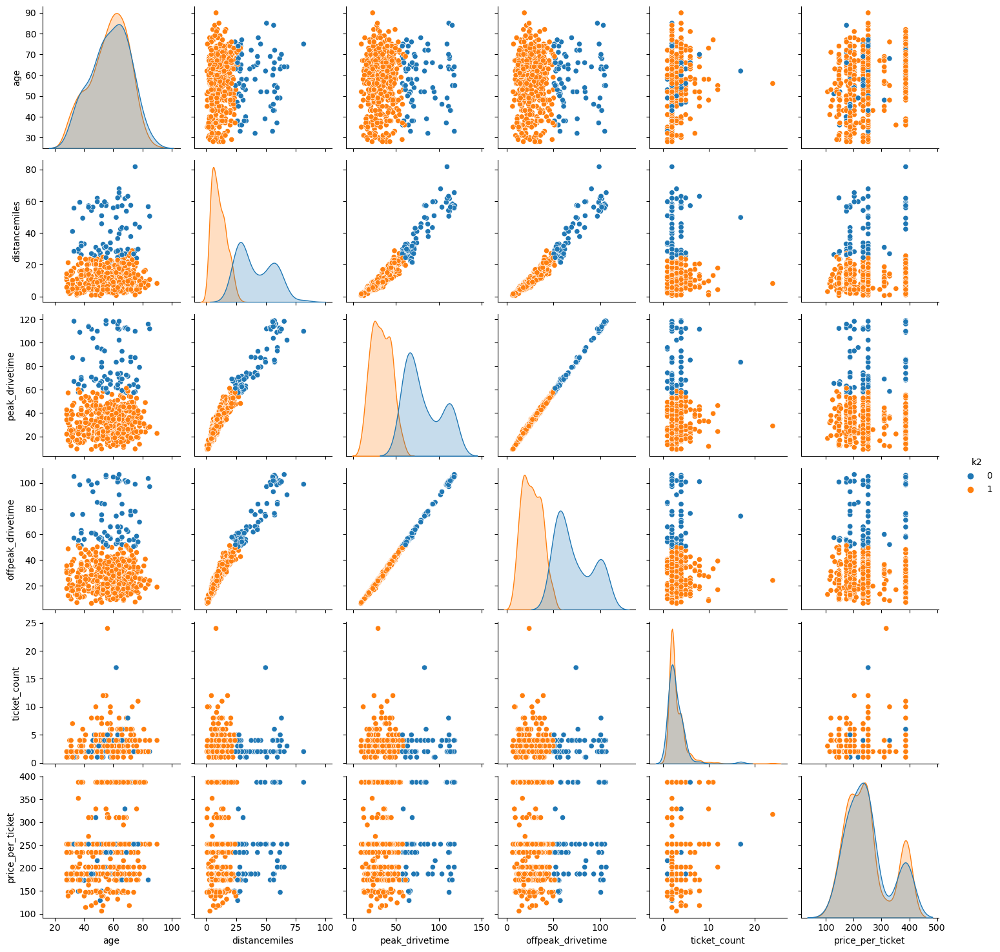

In [55]:
sns.pairplot(data = pitt_data_clean_copy, hue='k2', diag_kws={'common_norm': False})

plt.show()

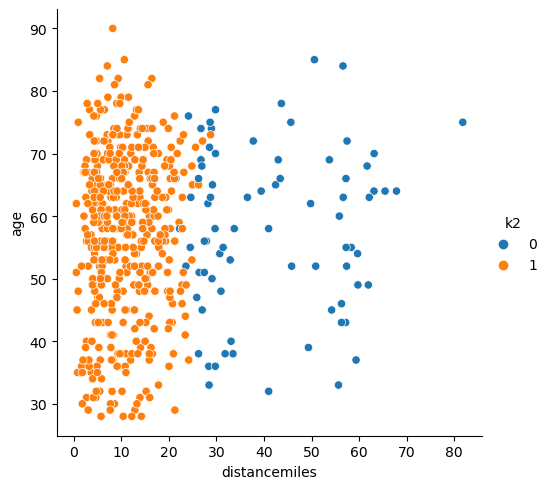

In [56]:
sns.relplot(data = pitt_data_clean_copy, x='distancemiles', y='age', hue='k2')

plt.show()

## Visualize the results using PCA

In [57]:
from sklearn.decomposition import PCA

In [58]:
pca_pitt = PCA(n_components=2).fit_transform( Xpitt_copy )

In [59]:
pca_pitt.shape

(512, 2)

In [60]:
clean_features.shape

(512, 6)

In [61]:
Xpitt_copy.shape

(512, 6)

In [62]:
pca_pitt_df = pd.DataFrame(pca_pitt, columns=['pc01', 'pc02'])

In [63]:
pca_pitt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 512 entries, 0 to 511
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   pc01    512 non-null    float64
 1   pc02    512 non-null    float64
dtypes: float64(2)
memory usage: 8.1 KB


In [64]:
pca_pitt_df['k2']=pd.Series( clusters_2, index=pca_pitt_df.index).astype('category')

In [65]:
pca_pitt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 512 entries, 0 to 511
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   pc01    512 non-null    float64 
 1   pc02    512 non-null    float64 
 2   k2      512 non-null    category
dtypes: category(1), float64(2)
memory usage: 8.7 KB


In [66]:
pca_pitt_df.k2.value_counts()

1    434
0     78
Name: k2, dtype: int64

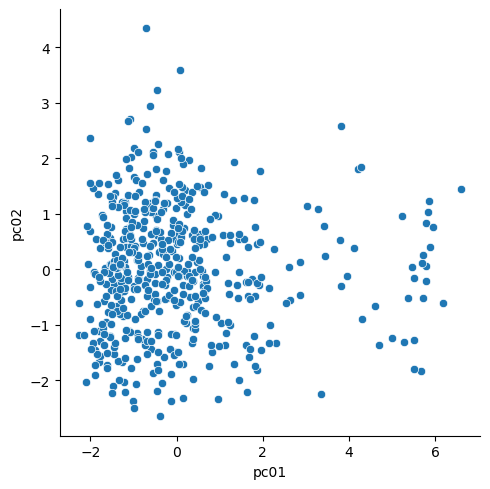

In [67]:
sns.relplot(data=pca_pitt_df, x='pc01', y='pc02')

plt.show()

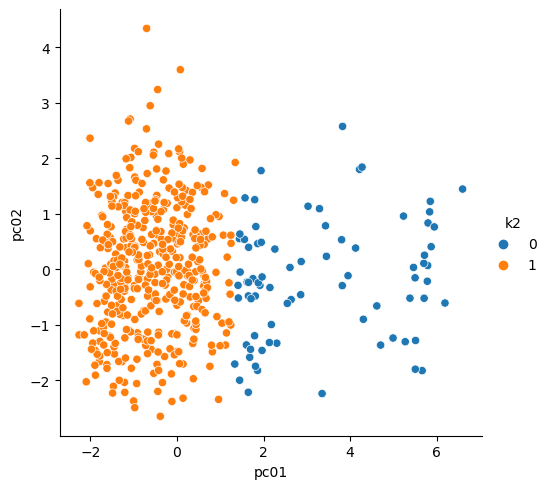

In [68]:
sns.relplot(data=pca_pitt_df, x='pc01', y='pc02', hue='k2')

plt.show()

This visualization is easier to interpret in that it shows a relationship between the two categories lower values of pc01 are grouped together and higher values of pc01 are grouped together. This seems to be similar to the data with distance and offpeak/peak_drivetime groupings.

## Identify the optimal number of clusters, rerun KMeans for the optimal number.

* Count the number of observations per identified cluster.
* Visualize the cluster results between 2 of the variables used for the cluster analysis.
* Visualize the cluster results using PCA. Is the visualization easier to interpret that the previous one?

In [69]:
tots_within = []

K = range(1, 31)

for k in K:
    km=KMeans(n_clusters=k, random_state=121, n_init=25, max_iter=500)
    km=km.fit(Xpitt_copy)
    
    tots_within.append(km.inertia_)

C:\Users\msilv\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\msilv\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\msilv\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\msilv\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:14

C:\Users\msilv\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\msilv\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\msilv\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


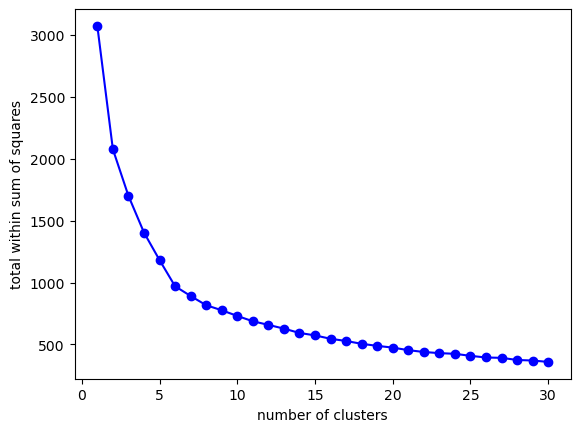

In [70]:
fig, ax =plt.subplots()

ax.plot(K, tots_within, 'bo-')
ax.set_xlabel('number of clusters')
ax.set_ylabel('total within sum of squares')

plt.show()

In [71]:
clusters_6 = KMeans(n_clusters=6, random_state=121, n_init=25, max_iter=500).fit_predict(Xpitt_copy)

C:\Users\msilv\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [72]:
pitt_data_clean_copy['k6']=pd.Series( clusters_6, index=pitt_data_clean_copy.index).astype('category')

In [73]:
pitt_data_clean_copy.k6.value_counts()

1    144
3    114
5    102
0     99
2     35
4     18
Name: k6, dtype: int64

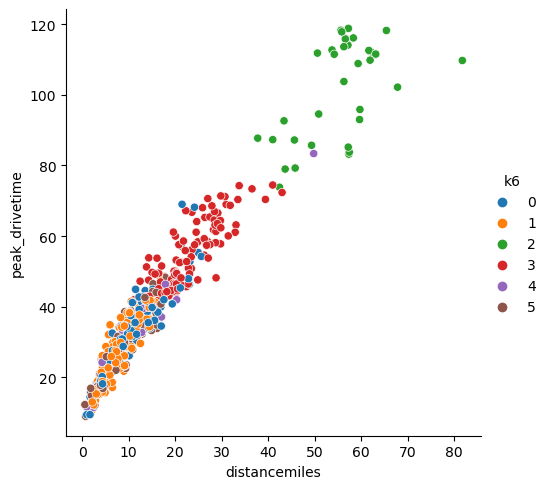

In [74]:
sns.relplot(data = pitt_data_clean_copy, x='distancemiles', y='peak_drivetime', hue='k6')

plt.show()

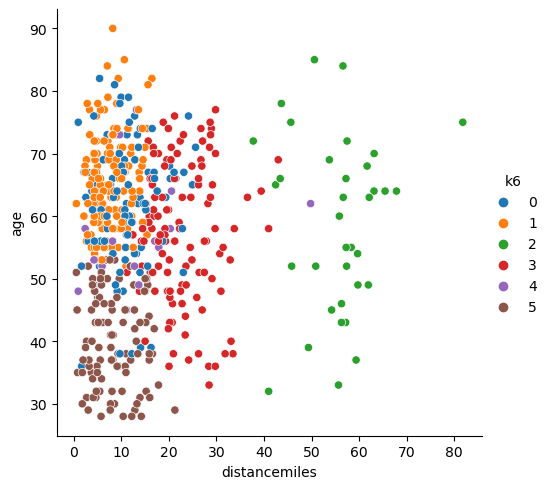

In [75]:
sns.relplot(data = pitt_data_clean_copy, x='distancemiles', y='age', hue='k6')

plt.show()

### PCA

In [76]:
pca_pitt_df['k6']= pd.Series( clusters_6, index=pca_pitt_df.index).astype('category')

In [77]:
pca_pitt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 512 entries, 0 to 511
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   pc01    512 non-null    float64 
 1   pc02    512 non-null    float64 
 2   k2      512 non-null    category
 3   k6      512 non-null    category
dtypes: category(2), float64(2)
memory usage: 9.5 KB


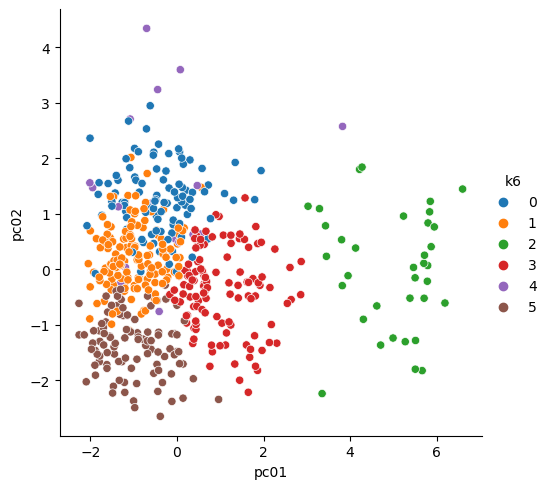

In [78]:
sns.relplot(data=pca_pitt_df, x='pc01', y='pc02', hue='k6')

plt.show()

This visualization is not easier to interpret in that there does not seem to be much relationship between the clusters. There is some very odd behavior with the PCA plot where one of the clusters seems to be very much intermingled with the other clusters and is very hard to see.

In [79]:
clusters_9 = KMeans(n_clusters=9, random_state=121, n_init=25, max_iter=500).fit_predict(Xpitt_copy)

C:\Users\msilv\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [80]:
pitt_data_clean_copy['k9']=pd.Series( clusters_9, index=pitt_data_clean_copy.index).astype('category')

In [81]:
pitt_data_clean_copy.k9.value_counts()

2    113
3     97
4     95
0     79
5     51
8     28
1     24
6     23
7      2
Name: k9, dtype: int64

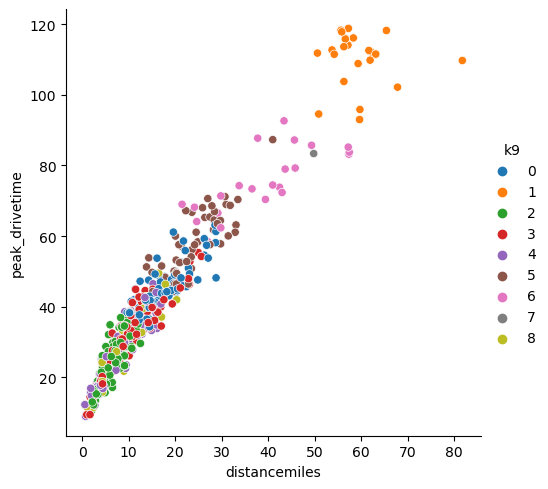

In [82]:
sns.relplot(data = pitt_data_clean_copy, x='distancemiles', y='peak_drivetime', hue='k9')

plt.show()

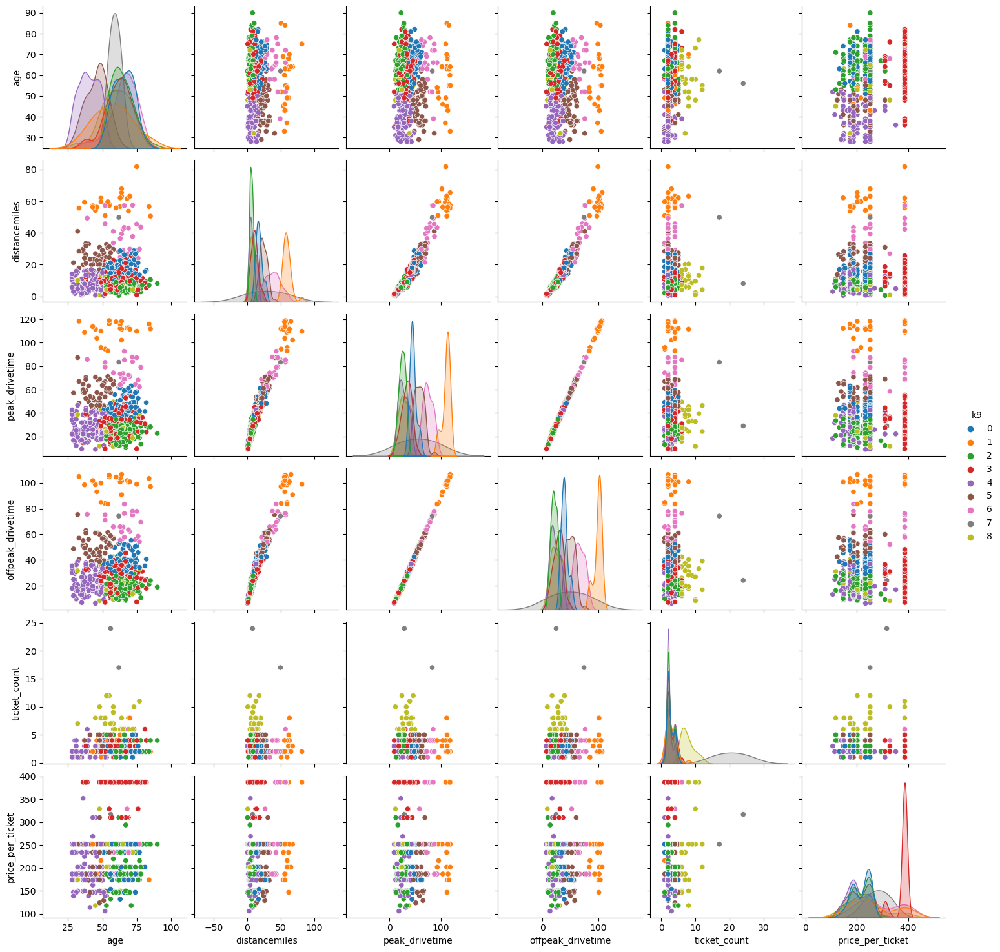

In [83]:
sns.pairplot(data = pitt_data_clean_copy, hue='k9', diag_kws={'common_norm': False})

plt.show()

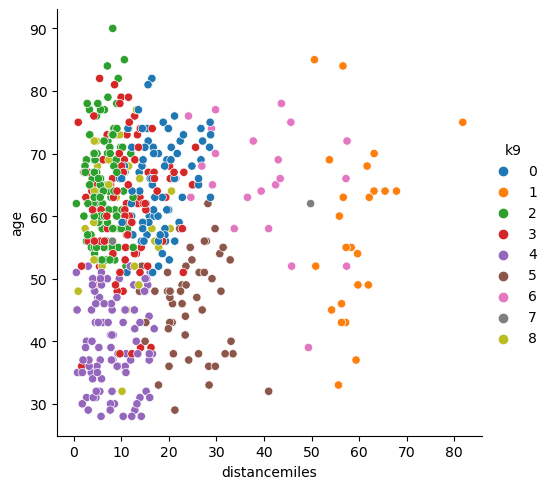

In [84]:
sns.relplot(data = pitt_data_clean_copy, x='distancemiles', y='age', hue='k9')

plt.show()

In [85]:
clusters_3 = KMeans(n_clusters=3, random_state=121, n_init=25, max_iter=500).fit_predict(Xpitt_copy)

C:\Users\msilv\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [86]:
pitt_data_clean_copy['k3']=pd.Series( clusters_3, index=pitt_data_clean_copy.index).astype('category')

In [87]:
pitt_data_clean_copy.k3.value_counts()

1    251
2    190
0     71
Name: k3, dtype: int64

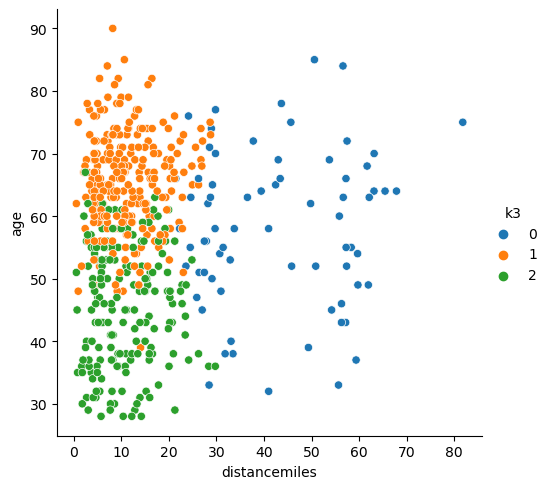

In [88]:
sns.relplot(data = pitt_data_clean_copy, x='distancemiles', y='age', hue='k3')

plt.show()

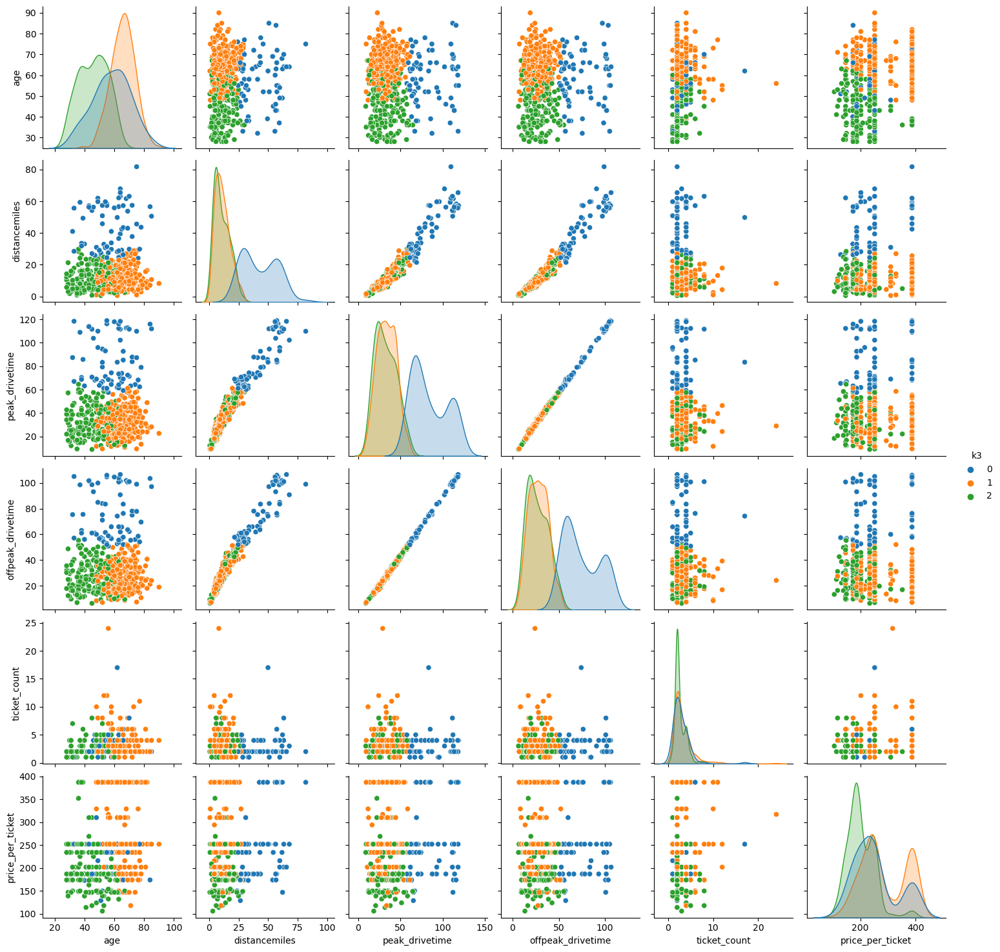

In [89]:
sns.pairplot(data = pitt_data_clean_copy, hue='k3', diag_kws={'common_norm': False})

plt.show()

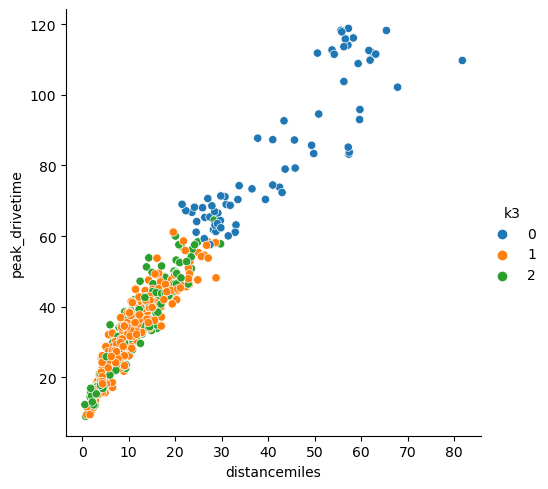

In [90]:
sns.relplot(data = pitt_data_clean_copy, x='distancemiles', y='peak_drivetime', hue='k3')

plt.show()

## Cluster Analysis Interpretation

#### Do the OPTIMAL number of clusters ALIGN with CATEGORIES of KNOWN grouping variables in your data?
* If you are working on a classification problem, are the identified clusters consistent with the outcome categories?

Looking at the graph to show optimal number of clusters there seems to be the possibility that anything between 6 and 10 could be the optimal number of clusters as such I went ahead and ran PCA for 6 and 9 to see which of these would fit best.
The optimal number of clusters (6 nor 9) seem to align with any categories of known grouping variables as far as I can tell. They certainly do not align with the outcome categories, since there are only 2 values for the outcome categories it makes sense that anything more than 2 clusters would not allign.

#### What are the CONDITIONAL distributions of the variables you used for clustering GIVEN the identified clusters?
* Use appropriate visualizations to study the CONDITIONAL distributions of the variables used for clustering GROUPED BY the identified clusters.
* HINT: you are creating CONDITIONAL distributions using the DERIVED cluster groupings rather than using a “real” categorical variable.
* Describe the clusters based on the CONDITIONAL distributions.

There does not appear to be a great relationship between the groupings created using KMeans and the conditional distributions of the continuous variables in the data set.

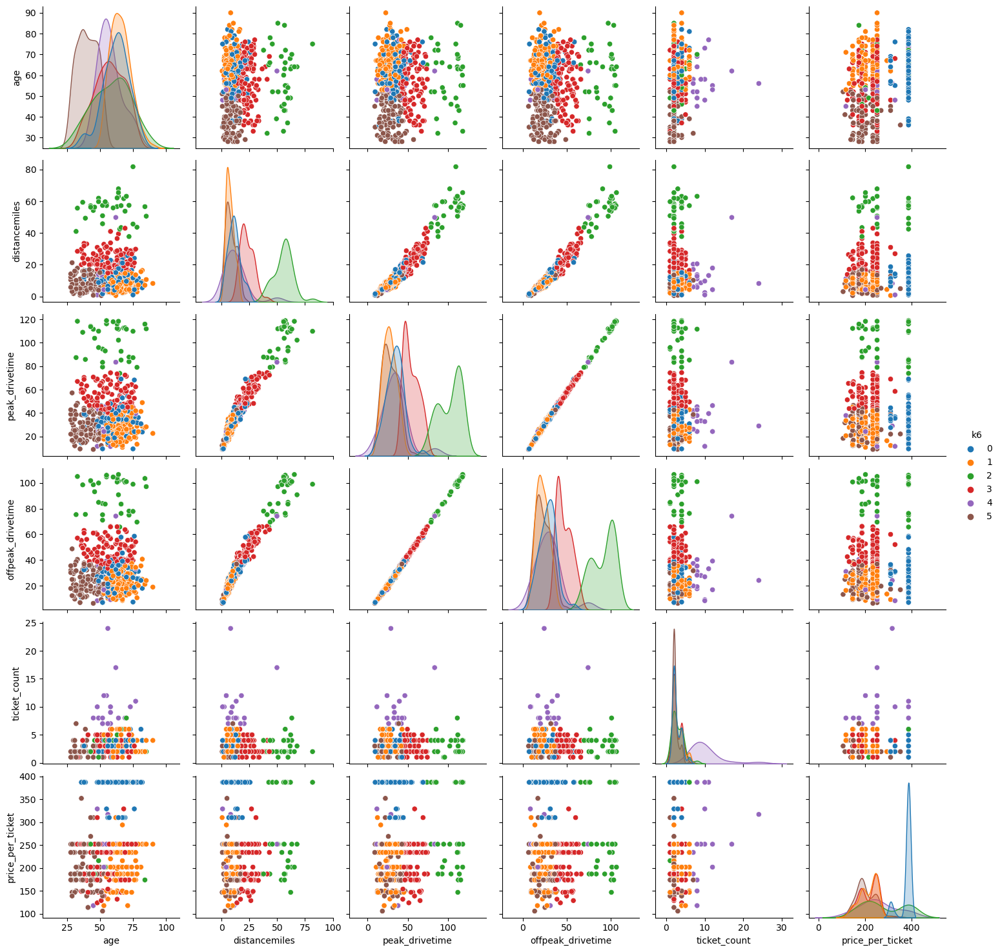

In [91]:
sns.pairplot(data = pitt_data_clean_copy, hue='k6', diag_kws={'common_norm': False})

plt.show()

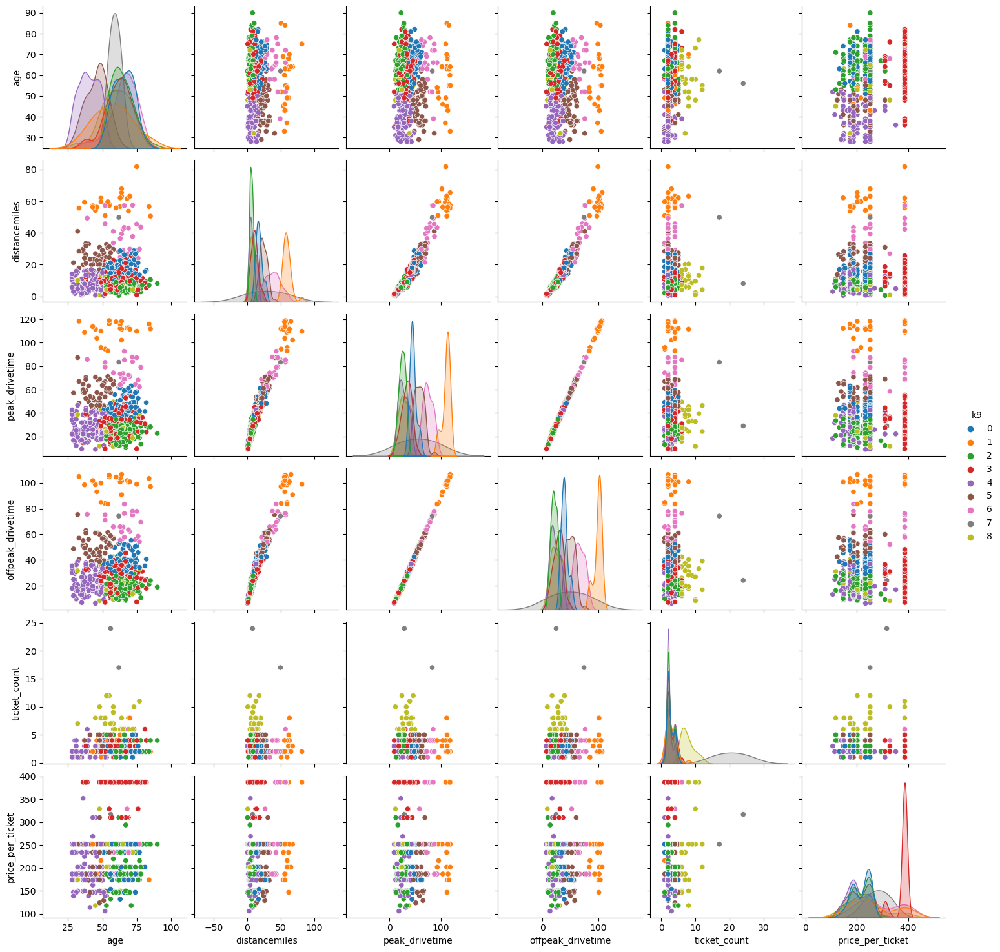

In [92]:
sns.pairplot(data = pitt_data_clean_copy, hue='k9', diag_kws={'common_norm': False})

plt.show()

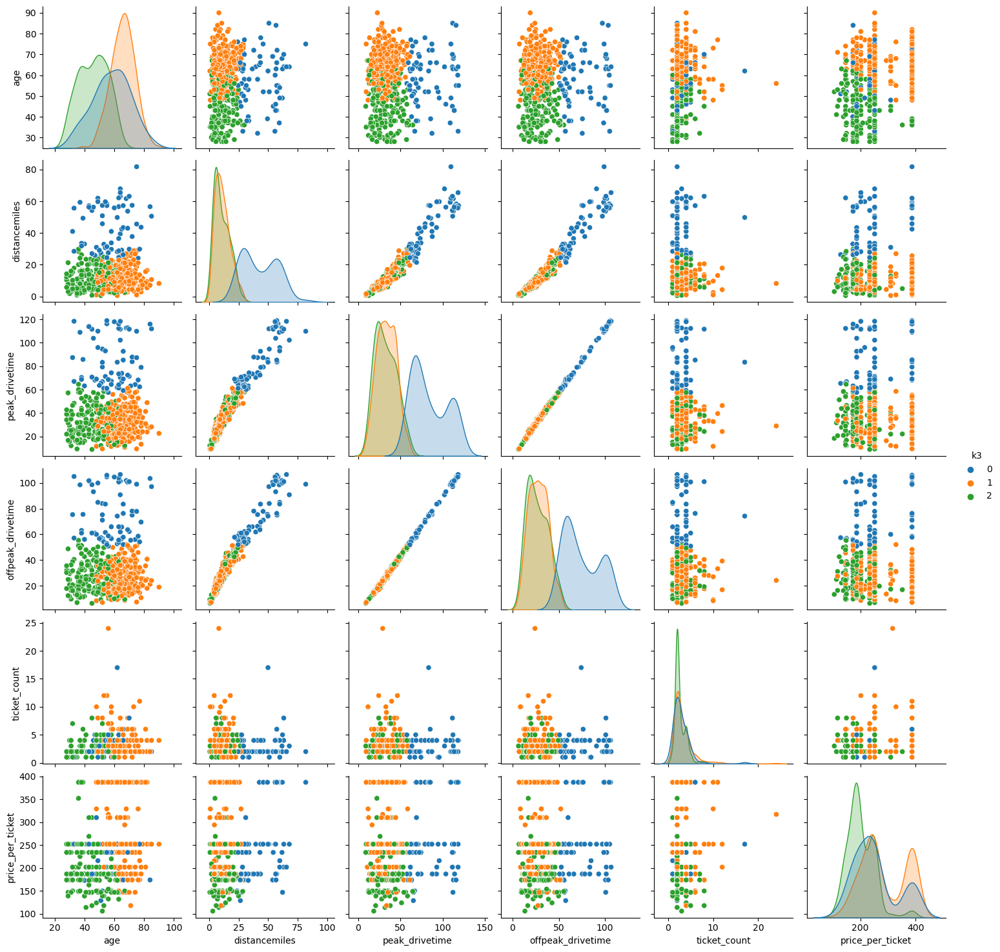

In [93]:
sns.pairplot(data = pitt_data_clean_copy, hue='k3', diag_kws={'common_norm': False})

plt.show()

I decided to look at using 3 KMeans clusters because I know that there are 3 input columns that are highly correlated with one another I wanted to see if 3 clusters would fit the model better. It does appear after looking at this that 3 clusters does seem to impact the age input so this visualization was an interesting one to look at.

## Visualizations of why I did not run KMeans and PCA with all continuous variables

In [94]:
clean_features1 = pitt_data_clean.select_dtypes('number').copy()

In [95]:
clean_features1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 512 entries, 2 to 3339
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   accountid          512 non-null    int64  
 1   age                512 non-null    float64
 2   distancemiles      512 non-null    float64
 3   peak_drivetime     512 non-null    float64
 4   offpeak_drivetime  512 non-null    float64
 5   season             512 non-null    int64  
 6   ticket_count       512 non-null    int64  
 7   price_per_ticket   512 non-null    float64
dtypes: float64(5), int64(3)
memory usage: 52.2 KB


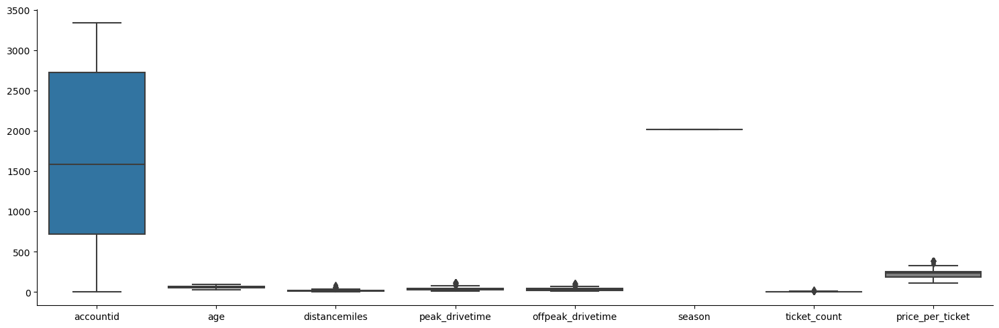

In [96]:
sns.catplot(data=pd.DataFrame(X, columns=clean_features1.columns), kind='box', aspect=3)

plt.show()

In [97]:
Xpitt = StandardScaler().fit_transform(clean_features1).copy()

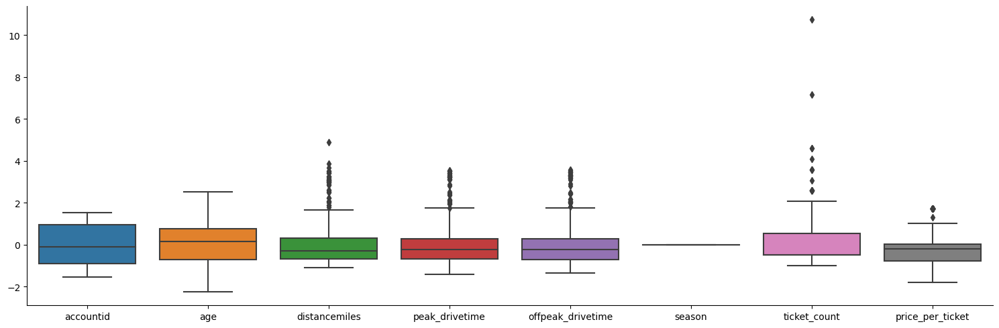

In [98]:
sns.catplot(data=pd.DataFrame(Xpitt, columns=clean_features1.columns), kind='box', aspect=3)

plt.show()

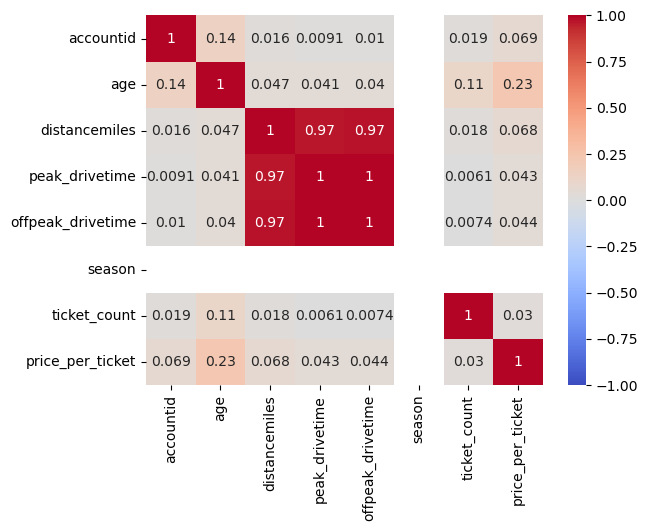

In [99]:
fig, ax = plt.subplots()

sns.heatmap(data = pitt_data_clean.corr(numeric_only=True),
            vmin=-1, vmax=1, center=0,
            cmap='coolwarm', annot=True, 
            ax=ax)

plt.show()

`season` because it only has one value literally has no correlation with the other variables, `accountid` you can calculate the correlation with the other numeric variables however there is no strong correlation.